In [1]:
import numpy as np 
import pandas as pd
import os
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Get the data from Kaggle

In [2]:
#sign in to kaggle.com -> got to settings -> API section -> create new token -> copy to './kaggle/kaggle.json'
os.environ['KAGGLE_USERNAME'] = "user name string from kaggle json"
os.environ['KAGGLE_KEY'] = "key string from kaggle json"

data_set = 'thedevastator/tropical-cyclone-tracks-dataset'
data_file ='Historical_Tropical_Storm_Tracks.csv'

In [3]:
#install kaggle
#os.system("pip install kaggle")

In [4]:
#get the Historical_Tropical_Storm_Tracks.csv
import kaggle
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()
api.dataset_download_file(data_set, data_file)
from zipfile import ZipFile
zf = ZipFile(data_file+'.zip')
zf.extractall()
zf.close()
data=pd.read_csv(data_file)

In [5]:
data

,index,FID,YEAR,MONTH,DAY,AD_TIME,BTID,NAME,LAT,LONG,WIND_KTS,PRESSURE,CAT,BASIN,Shape_Leng
0,0,2001,1957,8,8,1800Z,63,NOTNAMED,22.5,-140.0,50,0,TS,Eastern Pacific,1.140175
1,1,2002,1961,10,3,1200Z,116,PAULINE,22.1,-140.2,45,0,TS,Eastern Pacific,1.166190
2,2,2003,1962,8,29,0600Z,124,C,18.0,-140.0,45,0,TS,Eastern Pacific,2.102380
3,3,2004,1967,7,14,0600Z,168,DENISE,16.6,-139.5,45,0,TS,Eastern Pacific,2.121320
4,4,2005,1972,8,16,1200Z,251,DIANA,18.5,-139.8,70,0,H1,Eastern Pacific,1.702939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59223,59223,59224,2005,9,13,1800Z,1354,MARIA,63.0,-10.0,45,983,E,North Atlantic,10.000000
59224,59224,59225,2006,9,6,0000Z,804,IOKE,41.9,153.4,60,980,TS,Eastern Pacific,5.197115
59225,59225,59226,2005,9,21,0000Z,1356,OPHELIA,53.8,-22.0,40,998,E,North Atlantic,4.554119
59226,59226,59227,2005,9,21,0600Z,1356,OPHELIA,55.3,-17.7,35,998,E,North Atlantic,3.860052


## Exploratory Data Analysis using ydata

In [31]:
#  Exploratory Data Analysis (EDA)
os.system("pip install ydata-profiling")
os.system("conda install -c conda-forge ydata-profiling")
from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## first sort the dataset by category, grouped it by year

In [32]:
df1 = data.filter(items=['YEAR','CAT'])
cat_by_year_df = df1
cat_by_year_df = cat_by_year_df.reindex()

#build catalog min and max wind speeds counts
category = {
1:'AT',2:'SD',3:'TD',4:'L',5:'E',6:'W',
7:'TS',8:'SS',
9:'H1', 10:'H2',11:'H3',12:'H4',13:'H5'
}

#select find min and max winds by cat
catXwinds = data.filter(items=['CAT','WIND_KTS'])
category_agg_df = catXwinds.groupby('CAT')[['WIND_KTS']].agg(['min','max'])
count_yr_cat_agg_df = df1.groupby([df1['YEAR'], data['CAT'] ]).agg({'count'})
sorted_by_catxwind  = data.sort_values(by=["WIND_KTS","CAT","YEAR"])[["CAT", "WIND_KTS", "YEAR"]]

In [33]:
bp_df_ = count_yr_cat_agg_df.reset_index()
bp_df_

YEAR CAT      
               count
0     1851  H1    20
1     1851  H2     6
2     1851  H3     4
3     1851  TS    61
4     1852  H1    57
...    ...  ..   ...
1063  2008  H4    15
1064  2008   L   202
1065  2008  SS     5
1066  2008  TD   148
1067  2008  TS   407

[1068 rows x 3 columns]

## ... check the Tropical Cyclone Events 

plot each cyclone type count per each year available - and the pattern of more events per year is obvious

Text(0.5, 1.0, 'Tropical Cyclones per Year')

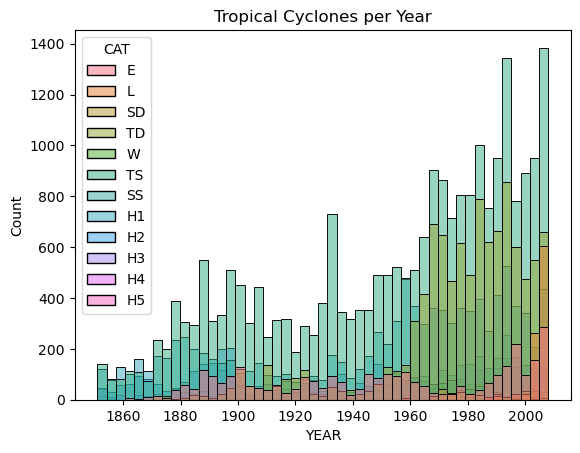

In [34]:
sns.histplot(data=sorted_by_catxwind, x = 'YEAR', hue="CAT")
plt.title("Tropical Cyclones per Year")

## ... next check the winds, year and category in a pairplot 

each of the plots in the pairplot shows that the intensity of the winds incrases through the years - and the pattern of higher winds per year is obvious

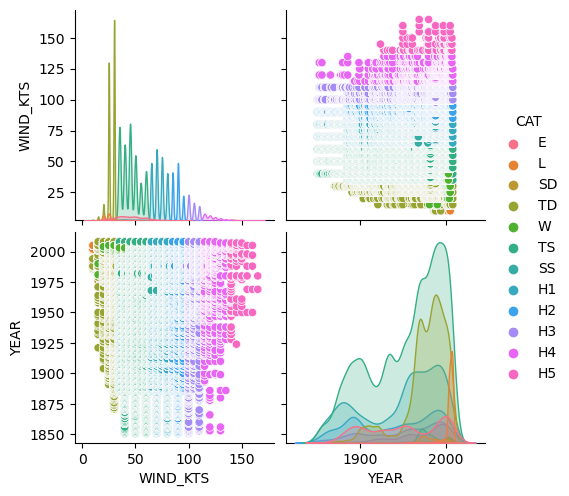

In [35]:
#pairplot
sns.pairplot(sorted_by_catxwind, hue="CAT")

## Finally let's look at each of the individual categories by the years

here we can see that each category (from TD to H5) have increase in number through the years 

In [36]:
#build a color catalog 
ploting_colors = {
1:'yellow',2:'lightblue',3:'pink',4:'blue',5:'magenta',6:'orange',
7:'green',8:'purple',
9:'cyan', 10:'brown',11:'lime',12:'salmon',13:'darkkhaki'
}

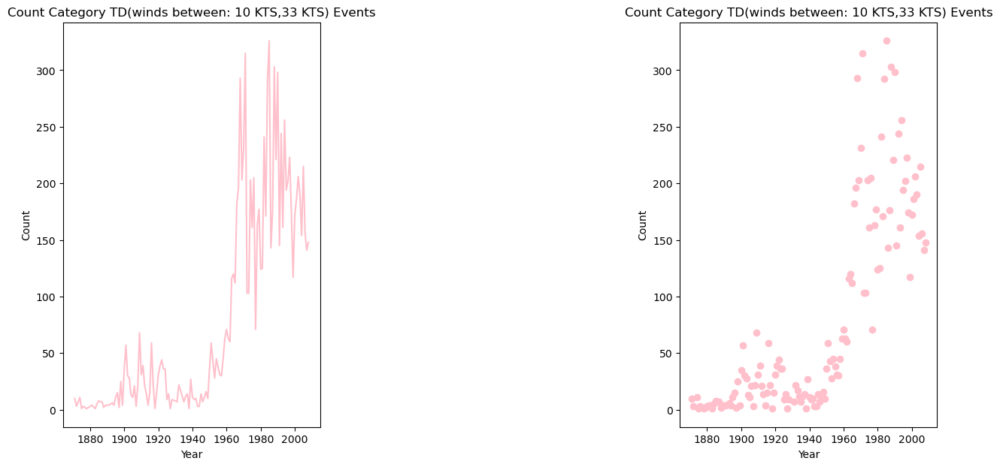

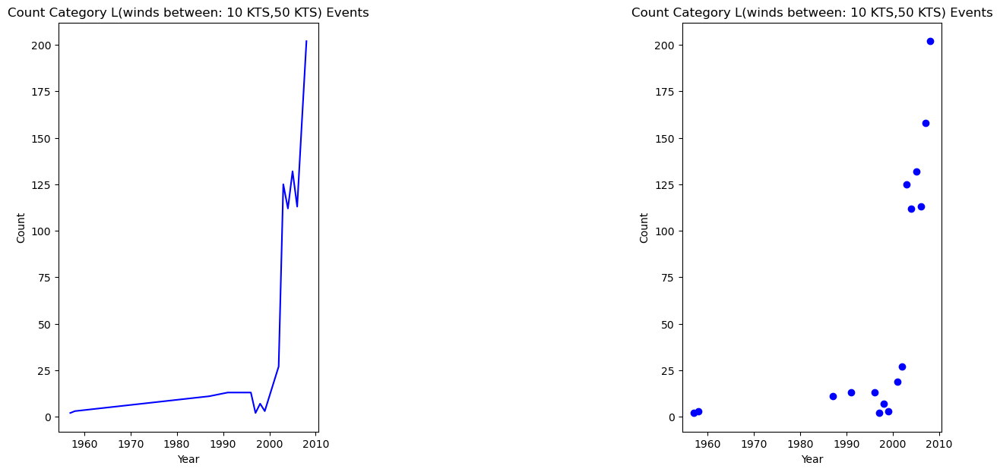

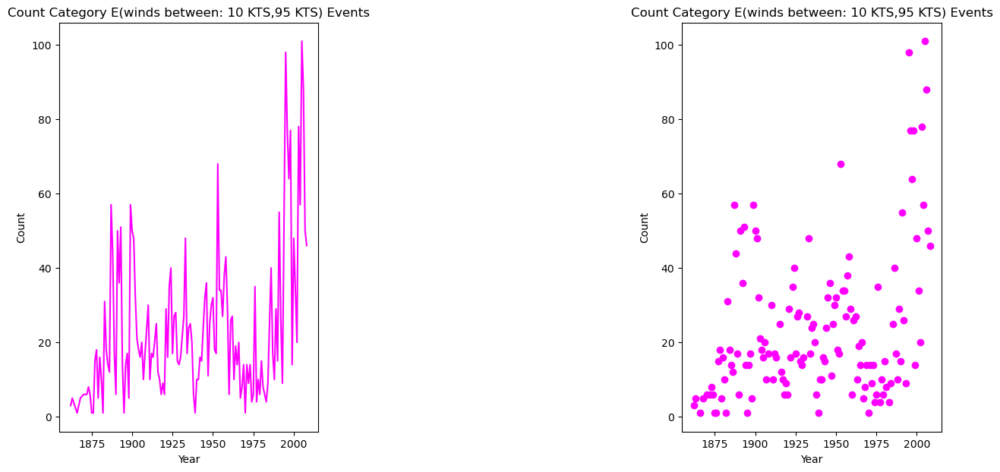

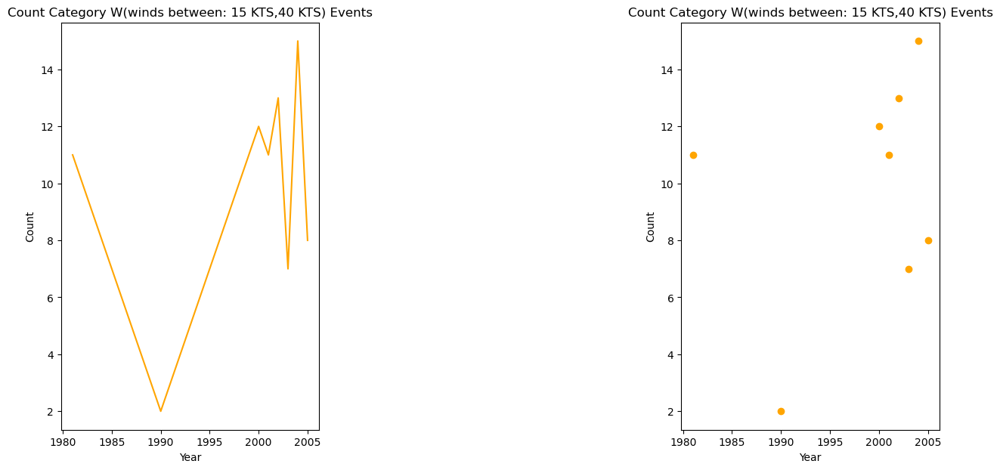

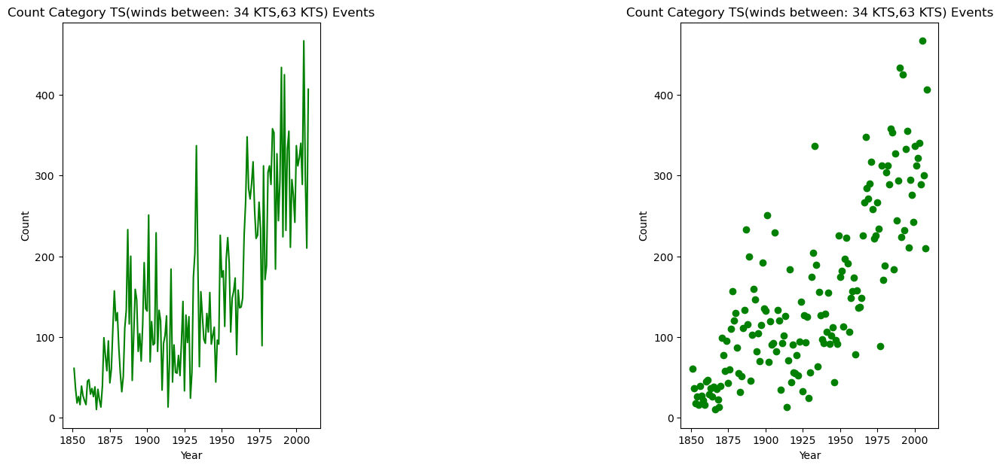

...

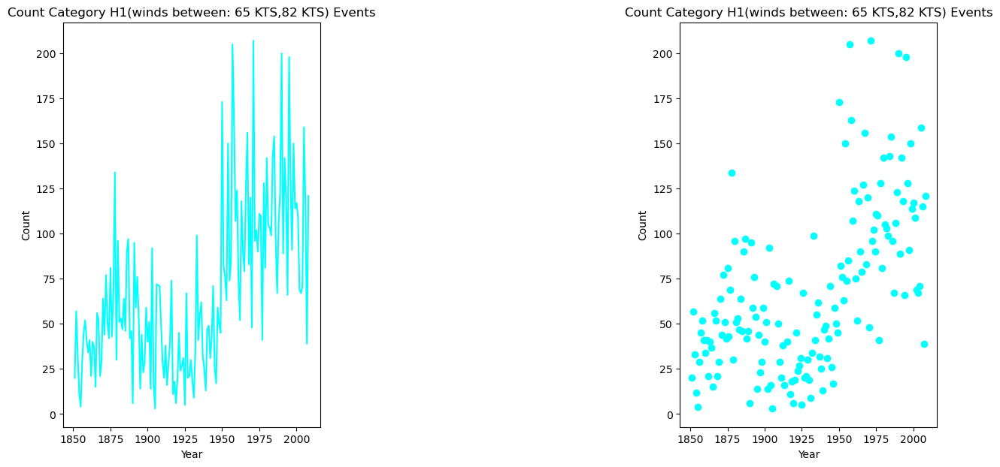

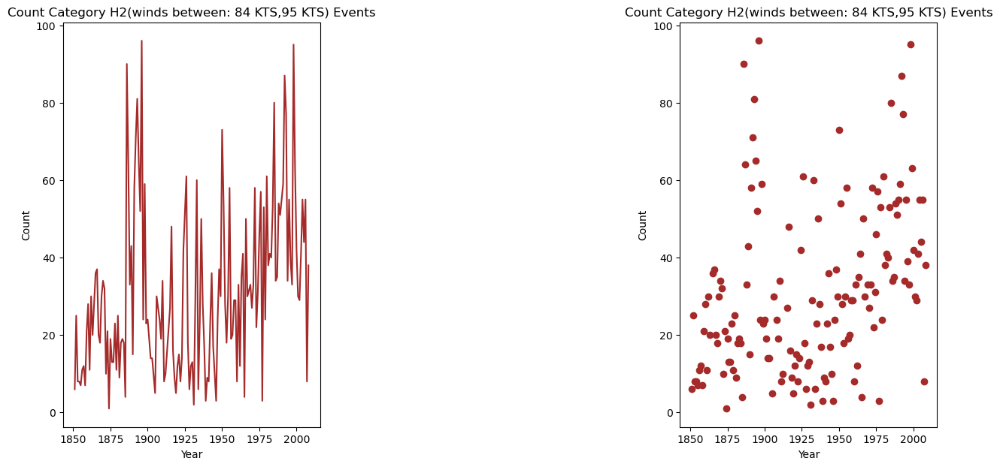

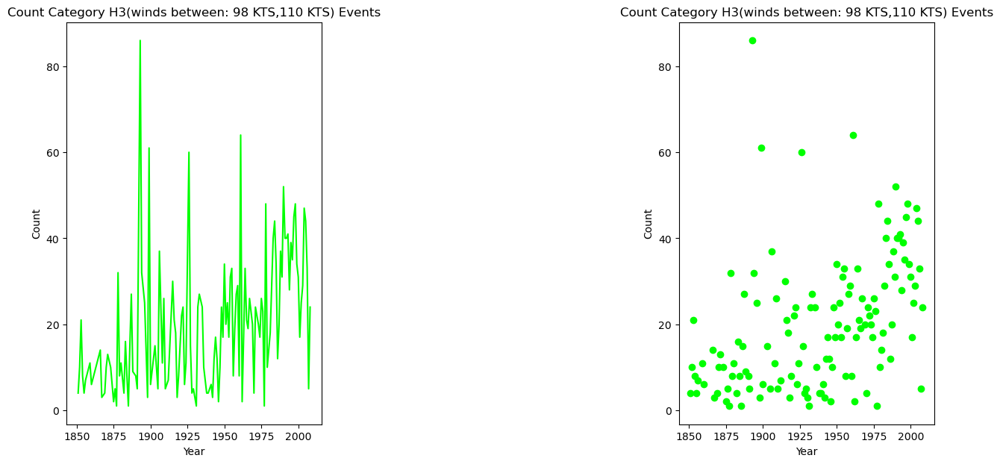

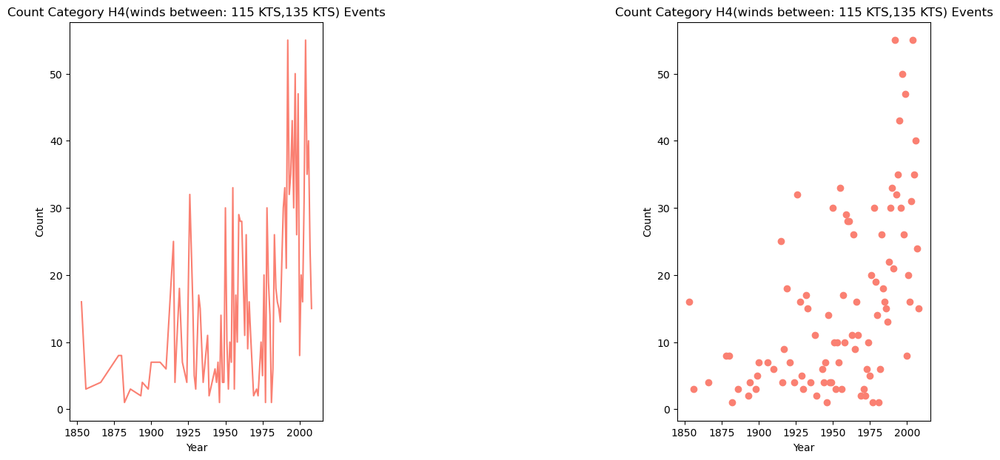

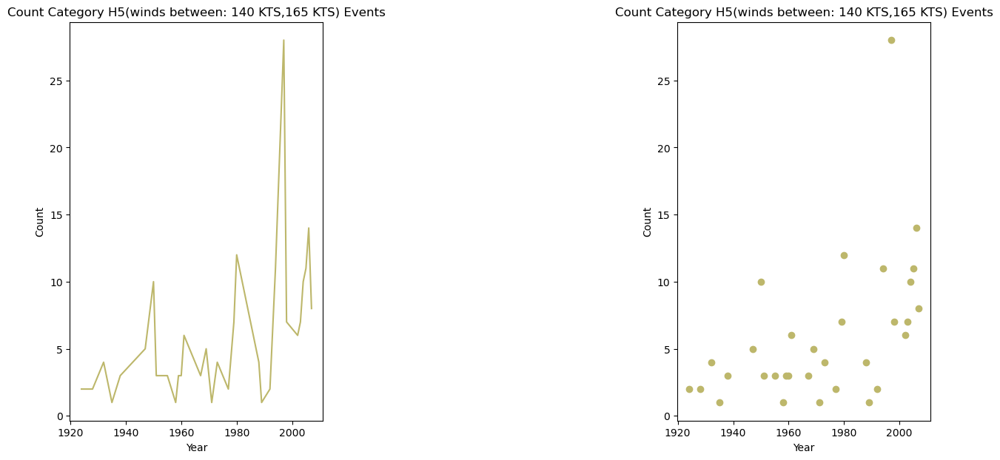

end of categories


In [37]:
#line, scatter, histogram by category:1:'AT',2:'SD',3:'TD',4:'L',5:'E',6:'W', 7:'TS', 8: 'SS', 9: 'H1', 10: 'H2', 11: 'H3', 12: 'H4', 13: 'H5'
def get_min_max_row (cat_):
    for i, row in category_agg_df.iterrows():
        if(i == cat_):
            return row
    return pd.Series([])
for x in range (3,14):
    fig2=plt.figure(figsize=(15,7))
    fig2ax1=fig2.add_subplot(1,3,1)
      
    x_cat = category[x]
    row_ = get_min_max_row(x_cat)
    if(row_.empty):
        print("no plot for ", x_cat)
    else:
        min_i = row_["WIND_KTS","min"]
        max_i = row_["WIND_KTS","max"]
        df_cat = count_yr_cat_agg_df.query('CAT == @x_cat')
        df_cat = df_cat.reset_index()
        
        fig2ax1= plt.plot(df_cat[('YEAR',      '')], df_cat[( 'CAT', 'count')],color=ploting_colors[x])
        plt.title("Count Category " +  x_cat  +  "(winds between: " +  str(min_i) + " KTS," +  str(max_i) + " KTS) Events")
        plt.xlabel("Year")
        plt.ylabel("Count")
        
        fig2ax2=fig2.add_subplot(1,3,3)
        fig2ax2=plt.scatter(x=df_cat[('YEAR',      '')], y=df_cat[( 'CAT', 'count')], color=ploting_colors[x])
        plt.title("Count Category " +  x_cat  +  "(winds between: " +  str(min_i) + " KTS," +  str(max_i) + " KTS) Events")
        plt.xlabel("Year")
        plt.ylabel("Count")
        
        plt.show()
print("end of categories")

## Conclusion

The plots show that as the years progressed the number of Tropical Cyclones has increased and their severity has worsened (presenting more severe and damaging categories)